In [83]:
# NOTE: Có thể sửa đổi code bên dưới đây để nhìn các case khác nhau tùy ý (vd. thay RVC-MVC-FVC level); nhưng phải ấn 'run all' cho code chạy hết một lượt rồi sau đó sửa và chạy lại cell mình muốn
# .head() là xem hoặc lấy bao nhiêu dòng đầu tiên của dataframe, có thể thay số trong ngoặc để lấy số dòng mong muốn
# một số bảng hiện thiếu, có thể ấn vào 'scrollable element' (nếu có) để rõ hơn

In [84]:
%pip install pandas matplotlib seaborn plotly kaleido openpyxl tabulate


Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\wh1skey\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [85]:
# Load thư viện cần thiết
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

_**CLEAN DATA**_

In [86]:
# Đọc dữ liệu từ file Excel
df=pd.read_excel('Online Retail Dataset.xlsx')
df.head(10)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850.0,United Kingdom
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850.0,United Kingdom
7,536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom
8,536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom
9,536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,2010-12-01 08:34:00,1.69,13047.0,United Kingdom


In [87]:
df.shape
# tệp dữ liệu có 541909 hàng (quan sát) và 8 cột (biến)

(541909, 8)

In [88]:
# Xem qua thông tin các biến
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [89]:
# Check missing values
df.isna().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [90]:
nan_description_rows = df[df['Description'].isna()]
display(nan_description_rows.head(30))
display(nan_description_rows.tail(30))
# khi check những dòng thiếu description thì thấy những dòng này có unitprice bằng 0 => kéo theo revenue = 0. Vì vậy ko có giá trị thống kê và có thể drop

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,2010-12-01 11:52:00,0.0,NaN,United Kingdom
1970,536545,21134,NaN,1,2010-12-01 14:32:00,0.0,NaN,United Kingdom
1971,536546,22145,NaN,1,2010-12-01 14:33:00,0.0,NaN,United Kingdom
1972,536547,37509,NaN,1,2010-12-01 14:33:00,0.0,NaN,United Kingdom
1987,536549,85226A,NaN,1,2010-12-01 14:34:00,0.0,NaN,United Kingdom
1988,536550,85044,NaN,1,2010-12-01 14:34:00,0.0,NaN,United Kingdom
2024,536552,20950,NaN,1,2010-12-01 14:34:00,0.0,NaN,United Kingdom
2025,536553,37461,NaN,3,2010-12-01 14:35:00,0.0,NaN,United Kingdom
2026,536554,84670,NaN,23,2010-12-01 14:35:00,0.0,NaN,United Kingdom
2406,536589,21777,NaN,-10,2010-12-01 16:50:00,0.0,NaN,United Kingdom


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
497632,578431,22579,NaN,-18,2011-11-24 12:15:00,0.0,NaN,United Kingdom
497677,578456,22579,NaN,11,2011-11-24 12:29:00,0.0,NaN,United Kingdom
498597,578529,22087,NaN,-23,2011-11-24 14:29:00,0.0,NaN,United Kingdom
499156,578628,23541,NaN,20,2011-11-24 15:55:00,0.0,NaN,United Kingdom
499157,578629,22943,NaN,24,2011-11-24 15:56:00,0.0,NaN,United Kingdom
499169,578632,22579,NaN,4,2011-11-24 16:22:00,0.0,NaN,United Kingdom
499787,578693,21811,NaN,1,2011-11-25 09:38:00,0.0,NaN,United Kingdom
500161,578738,21638,NaN,-33,2011-11-25 11:33:00,0.0,NaN,United Kingdom
508796,579272,22812,NaN,2,2011-11-29 10:00:00,0.0,NaN,United Kingdom
510622,579460,21110,NaN,-151,2011-11-29 14:39:00,0.0,NaN,United Kingdom


In [91]:
#drop những hàng có missing description như nói trên
df= df.dropna(subset='Description')
df.isna().sum()
#Xoá duplicate rows
duplicates = df.duplicated()
print(f"Number of duplicate rows: {duplicates.sum()}")
df = df.drop_duplicates()

Number of duplicate rows: 5268


In [92]:
# sẵn tiện thì bỏ luôn những hàng có unitprice = 0 (ko có ý nghĩa thống kê)
df = df[df['UnitPrice'] != 0.0]

In [93]:
# Thiếu CustomerID thì rất khó thay thế vì là thông tin cá nhân, nhưng trong case này sẽ tạm gán InvoiceNo cho những CustomerID thiếu
df = df.apply(lambda row: row.fillna(row['InvoiceNo']) if row.isnull().any() else row, axis=1)

_**EDA**_

trả lời câu hỏi: Which country drive the most sales?

<function matplotlib.pyplot.show(close=None, block=None)>

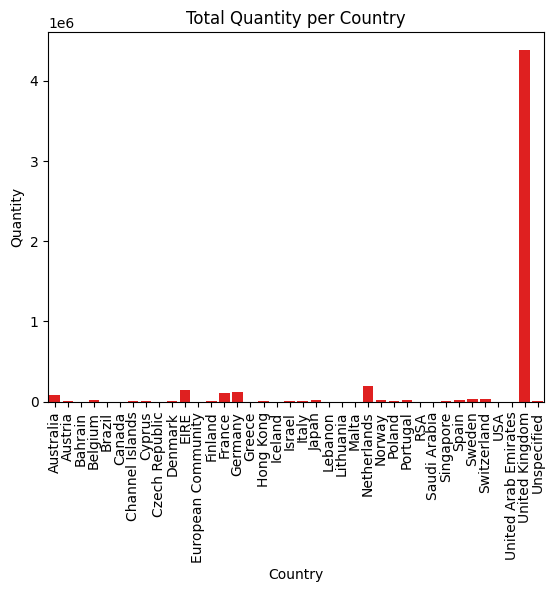

In [94]:
plotdata=df.groupby('Country')['Quantity'].sum()
sns.barplot(data=plotdata,color='red')
plt.xticks(rotation=90)
plt.title('Total Quantity per Country')
plt.xlabel('Country')
plt.ylabel('Quantity')
plt.show

What do they return the most?

In [95]:
# tạo một bảng mới chỉ chứa các sản phẩm bị trả lại (InvoiceNo bắt đầu bằng 'C')
returned_products_df = df[df['InvoiceNo'].astype(str).str.startswith('C')]
returned_products_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.0,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311.0,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom


In [96]:
# Đối với từng sản phẩm, có bao nhiêu lần nó bị trả lại (đếm theo số lần xuất hiện trong cột Description của bảng returned_products_df, chưa đếm quantity)
returned_product_counts = returned_products_df['Description'].value_counts()
returned_product_counts.head(10)

Description
Manual                               244
REGENCY CAKESTAND 3 TIER             180
POSTAGE                              126
JAM MAKING SET WITH JARS              87
Discount                              77
SET OF 3 CAKE TINS PANTRY DESIGN      73
SAMPLES                               60
ROSES REGENCY TEACUP AND SAUCER       54
STRAWBERRY CERAMIC TRINKET BOX        54
RECIPE BOX PANTRY YELLOW DESIGN       47
Name: count, dtype: int64

C:\Users\wh1skey\AppData\Local\Temp\ipykernel_8164\3919688033.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=returned_product_counts.head(10).index, y=returned_product_counts.head(10).values, palette='viridis')


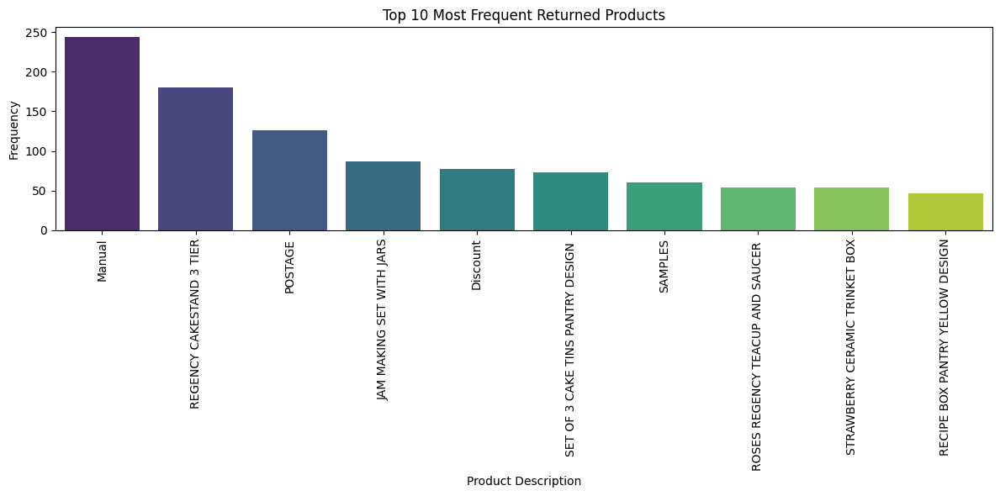

In [97]:
# Visualize bảng trên
plt.figure(figsize=(12, 6))
sns.barplot(x=returned_product_counts.head(10).index, y=returned_product_counts.head(10).values, palette='viridis')
plt.xticks(rotation=90)
plt.title('Top 10 Most Frequent Returned Products')
plt.xlabel('Product Description')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

In [98]:
# tạo một bảng mới chỉ chứa các sản phẩm KHÔNG bị trả lại
non_returned_products_df = df[~df['InvoiceNo'].astype(str).str.startswith('C')]

In [99]:
# Tính cột Expenditure = Quantity * UnitPrice cho cả hai bảng df (bảng dữ liệu gốc) và non_returned_products_df
df=df.assign(Expenditure=df['Quantity']*df['UnitPrice'])
non_returned_products_df=non_returned_products_df.assign(Expenditure=df['Quantity']*df['UnitPrice'])
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Expenditure
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34


In [100]:
exception_df = df[df['InvoiceNo'].astype(str).str.startswith('A')]
exception_df.head(10)
#Có những InvoiceNo bắt đầu bằng 'A' -- bad debt -- làm lệch insights về doanh thu nên sẽ loại bỏ chúng 

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Expenditure
299982,A563185,B,Adjust bad debt,1,2011-08-12 14:50:00,11062.06,A563185,United Kingdom,11062.06
299983,A563186,B,Adjust bad debt,1,2011-08-12 14:51:00,-11062.06,A563186,United Kingdom,-11062.06
299984,A563187,B,Adjust bad debt,1,2011-08-12 14:52:00,-11062.06,A563187,United Kingdom,-11062.06


In [101]:
# loại những InvoiceNo bắt đầu bằng 'A' khỏi non_returned_products_df
non_returned_products_df=non_returned_products_df[~non_returned_products_df['InvoiceNo'].astype(str).str.startswith('A')]

trả lời cho câu hỏi: 
How much do customer spent? 
What is the average purchase value? 

In [102]:
# Avg Spend per CustomerID (top 20 cao nhất)
avgspend = non_returned_products_df.groupby('CustomerID')['Expenditure'].mean()
avgspend.sort_values(ascending=False).head(20)

CustomerID
12346.0     77183.600000
16446.0     56157.500000
537632.0    13541.330000
15098.0     13305.500000
15749.0      4453.430000
560373.0     4287.630000
15195.0      3861.000000
13135.0      3096.000000
567353.0     2653.950000
546558.0     2583.760000
17846.0      2033.100000
18087.0      2027.860000
16532.0      1687.200000
560421.0     1592.490000
557377.0     1566.560000
16000.0      1377.077778
539856.0     1298.400000
16754.0      1001.200000
12755.0       952.987500
18133.0       931.500000
Name: Expenditure, dtype: float64

In [103]:
# Avg của tất cả khách hàng
avgspend.mean()

np.float64(60.89026717651264)

trả lời câu hỏi: What do they buy repeatedly?

C:\Users\wh1skey\AppData\Local\Temp\ipykernel_8164\2703498554.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=product_counts.index, y=product_counts.values, palette='viridis')


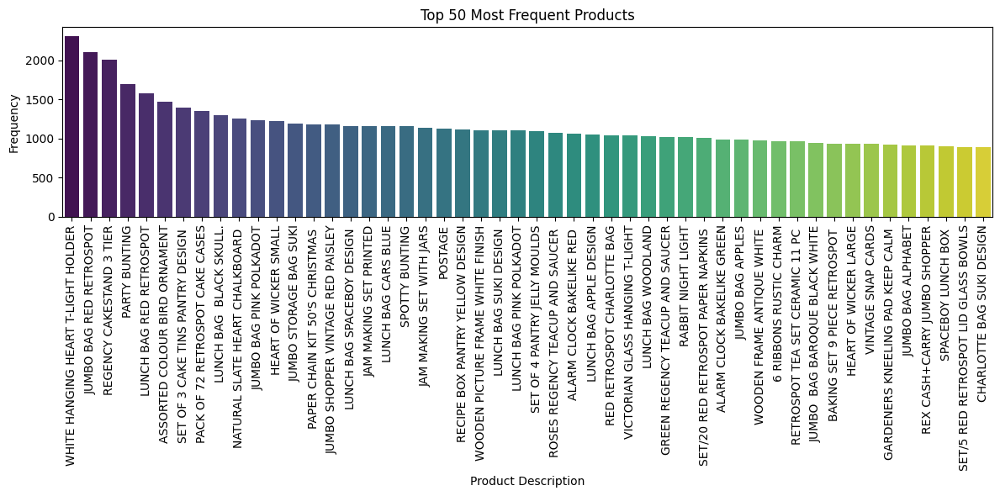

In [104]:
product_counts = non_returned_products_df['Description'].value_counts().head(50)

plt.figure(figsize=(12, 6))
sns.barplot(x=product_counts.index, y=product_counts.values, palette='viridis')
plt.xticks(rotation=90)
plt.title('Top 50 Most Frequent Products') # 50 săn phẩm được mua lại nhiều nhất, đếm theo số lần xuất hiện trong cột Description, chưa tính quantity
plt.xlabel('Product Description')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

trả lời câu hỏi: What do they buy the most?

C:\Users\wh1skey\AppData\Local\Temp\ipykernel_8164\2760192175.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=popular_product.index, y=popular_product.values, palette='viridis')


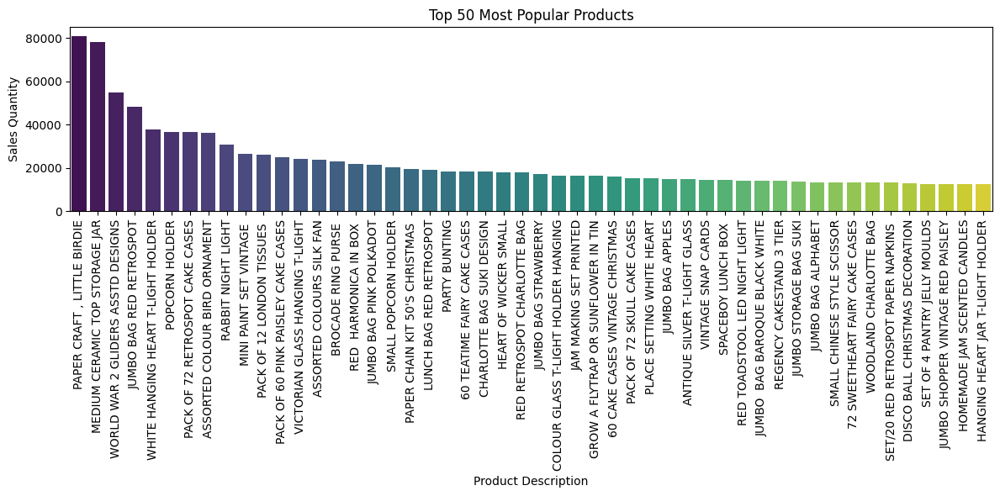

In [105]:
popular_product = non_returned_products_df.groupby('Description')['Quantity'].sum().sort_values(ascending=False).head(50)

plt.figure(figsize=(12, 6))
sns.barplot(x=popular_product.index, y=popular_product.values, palette='viridis')
plt.xticks(rotation=90)
plt.title('Top 50 Most Popular Products') # 50 săn phẩm phổ biến nhất, đếm theo tổng quantity mỗi Description
plt.xlabel('Product Description')
plt.ylabel('Sales Quantity')
plt.tight_layout()
plt.show()

**Profit-driver Items**

Which item drive in the most revenue?

C:\Users\wh1skey\AppData\Local\Temp\ipykernel_8164\719082857.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=profit_product.index, y=profit_product.values, palette='viridis')


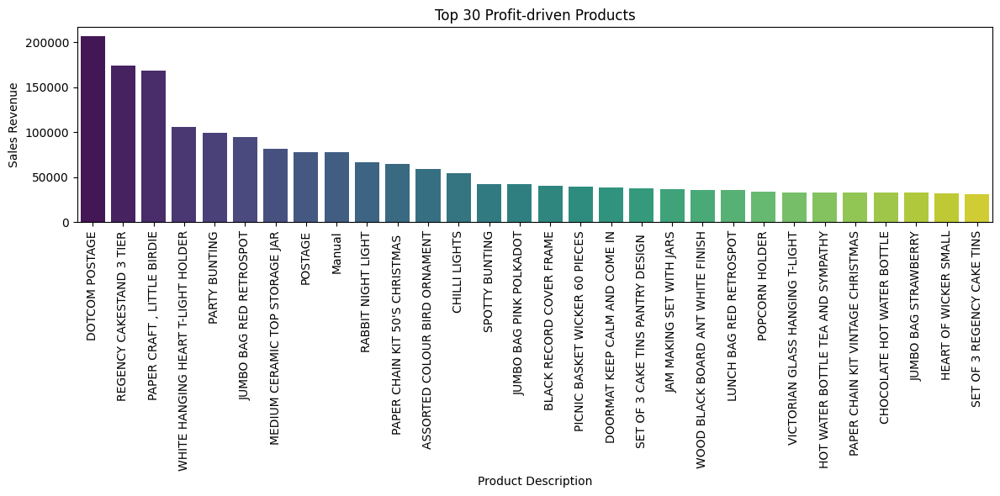

In [106]:
profit_product = non_returned_products_df.groupby('Description')['Expenditure'].sum().sort_values(ascending=False).head(30)

plt.figure(figsize=(12, 6))
sns.barplot(x=profit_product.index, y=profit_product.values, palette='viridis')
plt.xticks(rotation=90)
plt.title('Top 30 Profit-driven Products') # 50 săn phẩm phổ biến nhất, đếm theo tổng quantity mỗi Description
plt.xlabel('Product Description')
plt.ylabel('Sales Revenue')
plt.tight_layout()
plt.show()

Which item bring in the least?

C:\Users\wh1skey\AppData\Local\Temp\ipykernel_8164\3956788520.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=least_profit_product.index, y=least_profit_product.values, palette='viridis')


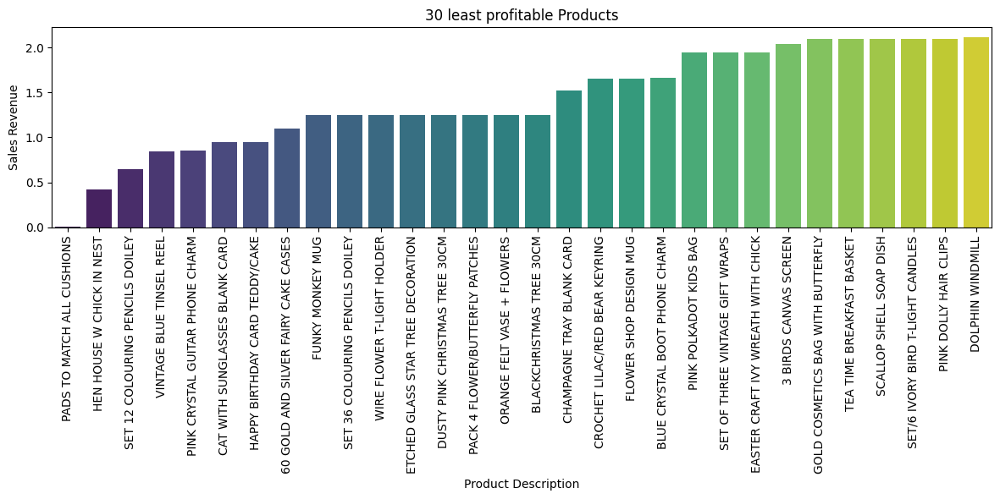

In [107]:
least_profit_product = non_returned_products_df.groupby('Description')['Expenditure'].sum().sort_values(ascending=True).head(30)

plt.figure(figsize=(12, 6))
sns.barplot(x=least_profit_product.index, y=least_profit_product.values, palette='viridis')
plt.xticks(rotation=90)
plt.title('30 least profitable Products') # 50 săn phẩm phổ biến nhất, đếm theo tổng quantity mỗi Description
plt.xlabel('Product Description')
plt.ylabel('Sales Revenue')
plt.tight_layout()
plt.show()

Which time during the day or month (or any occasion) that sales often happen?

In [108]:
# Tạo 1 cột chỉ có tháng và năm từ cột InvoiceDate trong bảng non_returned_products_df (InvoiceMonthYear)
non_returned_products_df['InvoiceMonthYear'] = non_returned_products_df['InvoiceDate'].dt.to_period('M')
non_returned_products_df.head()


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Expenditure,InvoiceMonthYear
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010-12
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010-12
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12


In [109]:
# thống kê có bao nhiêu invoice trong mỗi tháng
monthly_unique_invoices = non_returned_products_df.groupby('InvoiceMonthYear')['InvoiceNo'].nunique()
monthly_unique_invoices.head(10)

InvoiceMonthYear
2010-12    1559
2011-01    1086
2011-02    1100
2011-03    1454
2011-04    1246
2011-05    1681
2011-06    1533
2011-07    1475
2011-08    1360
2011-09    1837
Freq: M, Name: InvoiceNo, dtype: int64

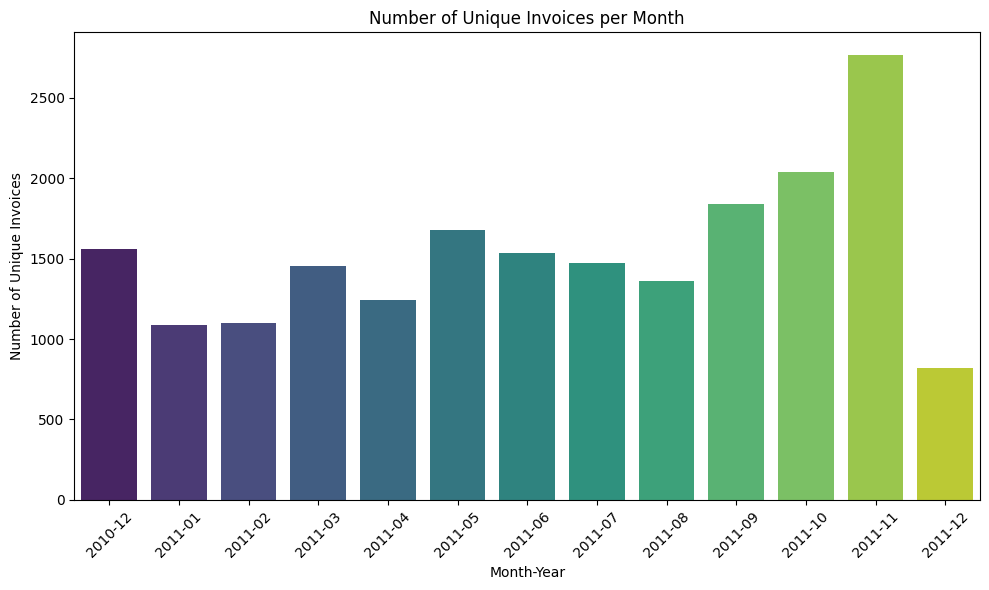

In [110]:
# Visualize bảng trên
plt.figure(figsize=(10, 6))
sns.barplot(x=monthly_unique_invoices.index.astype(str), y=monthly_unique_invoices.values, palette='viridis', hue=monthly_unique_invoices.index.astype(str), legend=False)
plt.title('Number of Unique Invoices per Month')
plt.xlabel('Month-Year')
plt.ylabel('Number of Unique Invoices')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

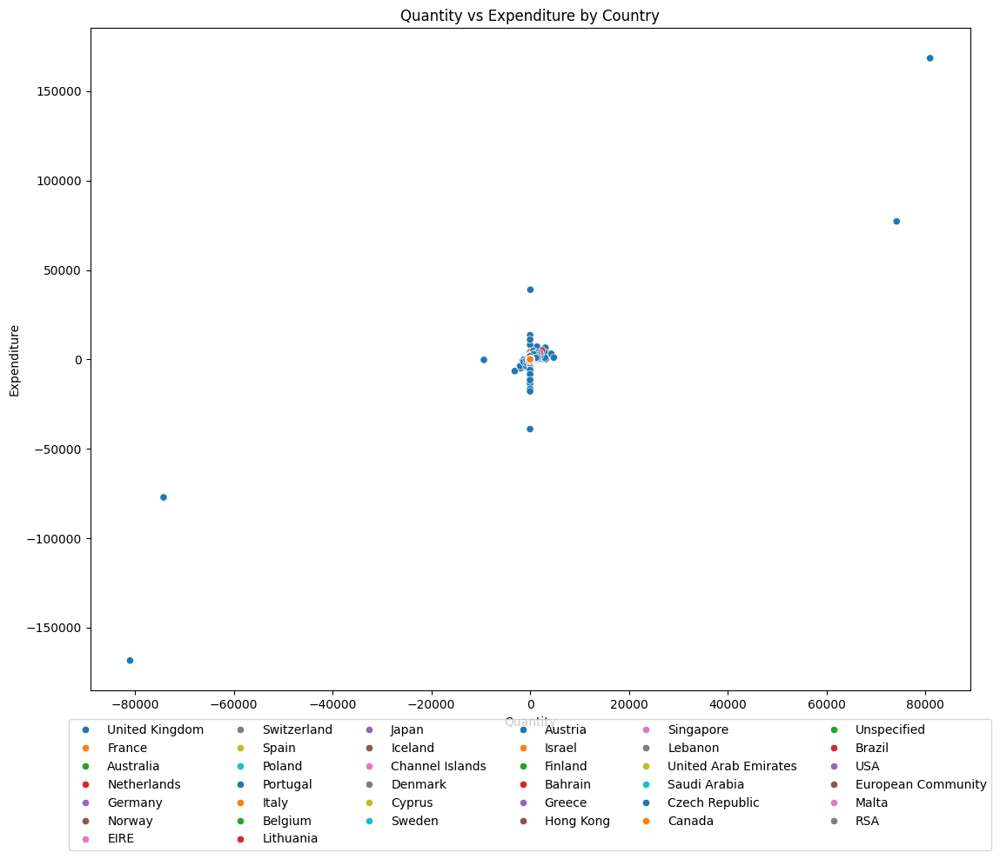

In [111]:
# Xem outliers trong mối quan hệ giữa Quantity và Expenditure (theo Country)
ScatterPrice=df[['Quantity', 'Expenditure', 'Country']]
plt.figure(figsize=(12, 10))
sns.scatterplot(data=ScatterPrice, x='Quantity', y='Expenditure', hue='Country', palette='tab10')
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.25), ncol=6)
plt.title('Quantity vs Expenditure by Country')
plt.tight_layout()
plt.show()

In [112]:
#check xem còn giao dịch lỗi ko
print(non_returned_products_df[(non_returned_products_df['Quantity'] <= 0) | (non_returned_products_df['UnitPrice'] <= 0)])

Empty DataFrame
Columns: [InvoiceNo, StockCode, Description, Quantity, InvoiceDate, UnitPrice, CustomerID, Country, Expenditure, InvoiceMonthYear]
Index: []


_**RFM**_

In [113]:
legit_df = non_returned_products_df

In [114]:
# Tạo một biên mới; MVC (Monetary Value per Customer) theo CustomerID
# Biến được tạo ra bằng cách tính tổng Expenditure cho mỗi CustomerID
mvc_by_receipt = legit_df.groupby('CustomerID')['Expenditure'].sum()
# Rồi sau đó map giá trị MVC này vào CustomerID trong bảng; như vậy thì mỗi CustomerID sẽ chỉ có một giá trị MVC duy nhất, dù có bao nhiêu giao dịch đi chăng nữa
legit_df['MVC'] = legit_df['CustomerID'].map(mvc_by_receipt)
# Phần khoảng MVC min | 25 | 50 | 75 | max và đánh số từ 1 đến 5 trong cột mới là cột 'MVC Level'
min_mvc = legit_df['MVC'].min()
max_mvc = legit_df['MVC'].max()
bins = np.linspace(min_mvc, max_mvc, 6)
legit_df['MVC Level'] = np.digitize(legit_df['MVC'], bins, right=True)
legit_df['MVC Level'] = legit_df['MVC Level'].clip(lower=1, upper=5)
legit_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Expenditure,InvoiceMonthYear,MVC,MVC Level
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010-12,5391.21,1
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12,5391.21,1
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010-12,5391.21,1
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12,5391.21,1
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12,5391.21,1


In [115]:
# dưới đây là bảng min và max của MVC theo từng MVC Level
mvc_min_max = legit_df.groupby('MVC Level')['MVC'].agg(['min', 'max'])
print(mvc_min_max)

                 min        max
MVC Level                      
1               0.42   54534.14
2           56252.72   91062.38
3          117210.08  143711.17
4          168472.50  194390.79
5          259657.30  280206.02


In [116]:
# Calculate FVC (Frequency Value per Customer) as the number of unique receipts per CustomerID
fvc_by_customer = legit_df.groupby('CustomerID')['InvoiceNo'].nunique()
# Map FVC value to each row in legit_df
legit_df['FVC'] = legit_df['CustomerID'].map(fvc_by_customer)
# chia khoảng và đánh số như trên 
min_fvc = legit_df['FVC'].min()
max_fvc = legit_df['FVC'].max()
bins = np.linspace(min_fvc, max_fvc, 6)
legit_df['FVC Level'] = np.digitize(legit_df['FVC'], bins, right=True)
legit_df['FVC Level'] = legit_df['FVC Level'].clip(lower=1, upper=5)
legit_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Expenditure,InvoiceMonthYear,MVC,MVC Level,FVC,FVC Level
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010-12,5391.21,1,34,1
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12,5391.21,1,34,1
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010-12,5391.21,1,34,1
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12,5391.21,1,34,1
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12,5391.21,1,34,1


In [117]:
# dưới đây là bảng min và max của FVC theo từng FVC Level
fvc_min_max = legit_df.groupby('FVC Level')['FVC'].agg(['min', 'max'])
print(fvc_min_max)

           min  max
FVC Level          
1            1   41
2           44   73
3           86  124
5          201  209


In [118]:
# Fix: Assign the same recency to all rows of the same CustomerID, based on their most recent transaction date
most_recent_date = legit_df['InvoiceDate'].max() + pd.Timedelta(days=1)
recency_by_customer = legit_df.groupby('CustomerID')['InvoiceDate'].max().apply(lambda x: (most_recent_date - x).days)
legit_df['Recency'] = legit_df['CustomerID'].map(recency_by_customer)
min_rvc = legit_df['Recency'].min()
max_rvc = legit_df['Recency'].max()
bins = np.linspace(min_rvc, max_rvc, 6)
legit_df['RVC Level'] = np.digitize(legit_df['Recency'], bins, right=True)
legit_df['RVC Level'] = legit_df['RVC Level'].clip(lower=1, upper=5)
legit_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Expenditure,InvoiceMonthYear,MVC,MVC Level,FVC,FVC Level,Recency,RVC Level
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010-12,5391.21,1,34,1,372,5
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12,5391.21,1,34,1,372,5
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010-12,5391.21,1,34,1,372,5
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12,5391.21,1,34,1,372,5
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12,5391.21,1,34,1,372,5


In [119]:
# dưới đây là bảng min và max của RVC theo từng RVC Level
rvc_min_max = legit_df.groupby('RVC Level')['Recency'].agg(['min', 'max'])
print(rvc_min_max)

           min  max
RVC Level          
1            1   75
2           76  150
3          151  223
4          225  299
5          301  374


In [120]:
# Create RFM column by combining RVC Level, FVC Level, and MVC Level
legit_df['RFM'] = legit_df['RVC Level'].astype(str) + legit_df['FVC Level'].astype(str) + legit_df['MVC Level'].astype(str)
legit_df['RFM'] = legit_df['RFM'].astype(int)
legit_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Expenditure,InvoiceMonthYear,MVC,MVC Level,FVC,FVC Level,Recency,RVC Level,RFM
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,2010-12,5391.21,1,34,1,372,5,511
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12,5391.21,1,34,1,372,5,511
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,2010-12,5391.21,1,34,1,372,5,511
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12,5391.21,1,34,1,372,5,511
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,2010-12,5391.21,1,34,1,372,5,511


In [121]:
#Unique RVC values
unique_rvc_values = legit_df['RVC Level'].unique()
print("Unique RVC Level values:", unique_rvc_values)

Unique RVC Level values: [5 1 2 4 3]


In [122]:
#Unique FVC values (chú ý nếu có thay FVC Level ở dưới thì ko có 4, nếu thay 4 thì sẽ rỗng)
unique_fvc_values = legit_df['FVC Level'].unique()
print("Unique FVC Level values:", unique_fvc_values)

Unique FVC Level values: [1 3 2 5]


In [123]:
#Unique MVC values
unique_mvc_values = legit_df['MVC Level'].unique()
print("Unique MVC Level values:", unique_mvc_values)

Unique MVC Level values: [1 2 3 4 5]


Who purchase multiple times?

In [124]:
#tạo bảng frequent_customers -- bảng những khách hàng mua nhiều hơn 1 lần (FVC khác 1); nhiều người có FVC = 1 nhưng họ mua rất nhiều lần
frequent_customers = legit_df[(legit_df['FVC'] != 1)]
print(frequent_customers.head(20))

   InvoiceNo StockCode                          Description  Quantity  \
0     536365    85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
1     536365     71053                  WHITE METAL LANTERN         6   
2     536365    84406B       CREAM CUPID HEARTS COAT HANGER         8   
3     536365    84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4     536365    84029E       RED WOOLLY HOTTIE WHITE HEART.         6   
5     536365     22752         SET 7 BABUSHKA NESTING BOXES         2   
6     536365     21730    GLASS STAR FROSTED T-LIGHT HOLDER         6   
7     536366     22633               HAND WARMER UNION JACK         6   
8     536366     22632            HAND WARMER RED POLKA DOT         6   
9     536367     84879        ASSORTED COLOUR BIRD ORNAMENT        32   
10    536367     22745           POPPY'S PLAYHOUSE BEDROOM          6   
11    536367     22748            POPPY'S PLAYHOUSE KITCHEN         6   
12    536367     22749    FELTCRAFT PRINCESS CHARLO

In [125]:
# số khách hàng mua nhiều hơn 1 lần theo từng FVC Level
plot_frequent_customers = frequent_customers['FVC Level'].value_counts()
print(plot_frequent_customers)

FVC Level
1    323934
3     14838
2     10940
5     10082
Name: count, dtype: int64


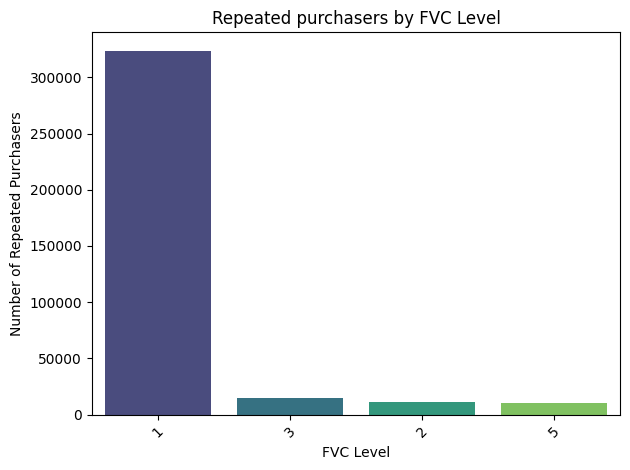

In [126]:
# Visualize bảng trên
sns.barplot(x= plot_frequent_customers.index.astype(str), y= plot_frequent_customers.values, palette='viridis', hue= plot_frequent_customers.index.astype(str), legend=False)
plt.title('Repeated purchasers by FVC Level')
plt.xlabel('FVC Level')
plt.ylabel('Number of Repeated Purchasers')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

What is their average expenditure?

In [127]:
# đây là tính avg theo từng CustomerID trong bảng frequent_customers
avg_frequent_spend = frequent_customers.groupby('CustomerID')['Expenditure'].mean()
print(avg_frequent_spend)

CustomerID
12347.0    23.681319
12348.0    57.975484
12352.0    29.482824
12356.0    47.651356
12358.0    61.476842
             ...    
18272.0    18.545663
18273.0    68.000000
18282.0    14.837500
18283.0     2.837074
18287.0    26.246857
Name: Expenditure, Length: 2845, dtype: float64


In [128]:
# đây là avg của tất cả khách hàng trong bảng frequent_customers
overall_avg_frequent_spend = avg_frequent_spend.mean()
print(overall_avg_frequent_spend)

57.46926006648796


In [129]:
# còn đây là avg theo từng nhóm FVC Level trong bảng frequent_customers
avg_frequent_spend_fvc= frequent_customers.groupby('FVC Level')['Expenditure'].mean()
print(avg_frequent_spend_fvc)

FVC Level
1     20.331265
2    121.324148
3     12.345379
5     17.532668
Name: Expenditure, dtype: float64


What do repeated purchasers usually buy? Is there a pattern?

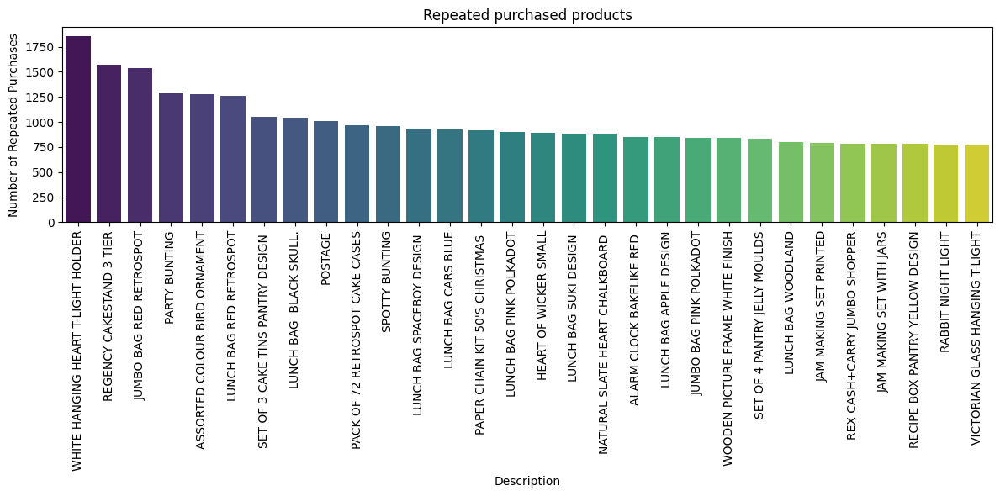

In [130]:
repeated_products = frequent_customers['Description'].value_counts().head(30)
plt.figure(figsize=(12, 6))
sns.barplot(x= repeated_products.index, y= repeated_products.values, palette='viridis', hue= repeated_products.index.astype(str), legend=False)
plt.title('Repeated purchased products')
plt.xlabel('Description')
plt.ylabel('Number of Repeated Purchases')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

**One Timer**

How recent was their purchase? What did they buy?

In [131]:
# bảng những khách hàng chỉ mua một lần (FVC = 1)
One_timer = legit_df[(legit_df['FVC'] == 1)]
print(One_timer.head(10))

    InvoiceNo StockCode                          Description  Quantity  \
155    536384     82484    WOOD BLACK BOARD ANT WHITE FINISH         3   
156    536384     84755  COLOUR GLASS T-LIGHT HOLDER HANGING        48   
157    536384     22464          HANGING METAL HEART LANTERN        12   
158    536384     21324         HANGING MEDINA LANTERN SMALL         6   
159    536384     22457      NATURAL SLATE HEART CHALKBOARD         12   
160    536384     22469                HEART OF WICKER SMALL        40   
161    536384     22470                HEART OF WICKER LARGE        40   
162    536384     22224               WHITE LOVEBIRD LANTERN         6   
163    536384     21340  CLASSIC METAL BIRDCAGE PLANT HOLDER         2   
164    536384     22189              CREAM HEART CARD HOLDER         4   

            InvoiceDate  UnitPrice CustomerID         Country  Expenditure  \
155 2010-12-01 09:53:00       6.45    18074.0  United Kingdom        19.35   
156 2010-12-01 09:53:00      

In [132]:
# Avg recency của những khách hàng chỉ mua một lần
One_timer_avg_recency = One_timer['Recency'].mean()
print(One_timer_avg_recency)

169.5659516727949


What was their average expenditure?

In [133]:
One_timer_avg_spend = One_timer['Expenditure'].mean()
print(One_timer_avg_spend)

14.282690592005236


In [134]:
print(One_timer['InvoiceDate'])

155      2010-12-01 09:53:00
156      2010-12-01 09:53:00
157      2010-12-01 09:53:00
158      2010-12-01 09:53:00
159      2010-12-01 09:53:00
                 ...        
541801   2011-12-09 12:16:00
541802   2011-12-09 12:16:00
541803   2011-12-09 12:16:00
541804   2011-12-09 12:16:00
541805   2011-12-09 12:16:00
Name: InvoiceDate, Length: 165083, dtype: datetime64[ns]


**High-value IDs**

Who are the revenue contributors?

In [135]:
# bảng những khách hàng có MVC Level = 5, sắp xếp theo Expenditure giảm dần
high_value_ids = legit_df[legit_df['MVC Level'] == 5].sort_values(by='Expenditure', ascending=False)
print(high_value_ids)

       InvoiceNo StockCode                       Description  Quantity  \
421601    573003     23084                RABBIT NIGHT LIGHT      2400   
16438     537659     21623      VINTAGE UNION JACK MEMOBOARD       600   
411234    572209     23553       LANDMARK FRAME CAMDEN TOWN        300   
411229    572209     23556     LANDMARK FRAME COVENT GARDEN        300   
411235    572209     23557      LANDMARK FRAME BAKER STREET        300   
...          ...       ...                               ...       ...   
434722    574059     23507  MINI PLAYING CARDS BUFFALO BILL          1   
434732    574059     23551  PACK OF 12 PAISLEY PARK TISSUES          1   
434731    574059     23380  PACK OF 12 VINTAGE DOILY TISSUES         1   
434730    574059     21981      PACK OF 12 WOODLAND TISSUES          1   
434729    574059     22614       PACK OF 12 SPACEBOY TISSUES         1   

               InvoiceDate  UnitPrice CustomerID         Country  Expenditure  \
421601 2011-10-27 12:11:00    

What is their average invoice value?

In [136]:
# Avg Expenditure của những khách hàng có MVC Level = 5 theo từng CustomerID và InvoiceNo
high_value_avg_spend = high_value_ids.groupby(['CustomerID', 'InvoiceNo'])['Expenditure'].mean()
print(high_value_avg_spend)

CustomerID  InvoiceNo
14646.0     539491         4.435000
            539731       157.794815
            541206       131.507089
            541570       234.001212
            541608       152.640000
                            ...    
18102.0     574383        20.150000
            579139       286.080000
            581455        59.298182
            581457       942.165455
            581566       469.440000
Name: Expenditure, Length: 133, dtype: float64


In [137]:
# Avg của tất cả khách hàng có MVC Level = 5
high_value_avg_spend.mean()

np.float64(460.5656588093303)

What do high-value customers usually buy?

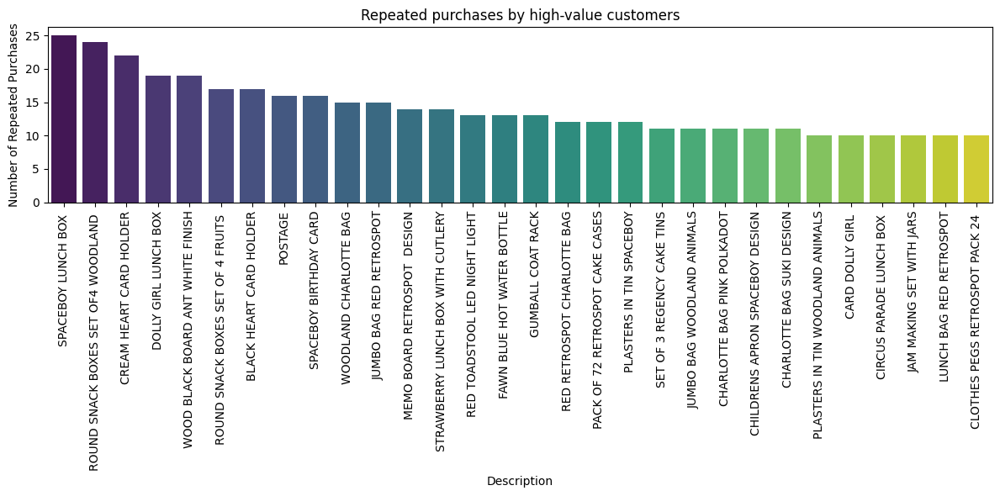

In [138]:
high_value_buy = high_value_ids['Description'].value_counts().head(30)
plt.figure(figsize=(12, 6))
sns.barplot(x= high_value_buy.index, y= high_value_buy.values, palette='viridis', hue= high_value_buy.index.astype(str), legend=False)
plt.title('Repeated purchases by high-value customers')
plt.xlabel('Description')
plt.ylabel('Number of Repeated Purchases')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

For repeated purchasers, how far apart are their purchases?

In [139]:
#3 Most frequent purchasing customers based on FVC Level 
top_customers = legit_df.groupby('CustomerID')['FVC Level'].max().nlargest(3)
print("Top 3 Most Frequent Purchasing Customers based on FVC Level:" + top_customers.to_string())
# Trong top 3 đã có 2 khách hàng có MVC Level = 5, và sự chênh lệch giữa khách hàng thứ 2 và thứ 3 đã là khá lớn

Top 3 Most Frequent Purchasing Customers based on FVC Level:CustomerID
12748.0    5
14911.0    5
12971.0    3


In [140]:
#For repeated purchasers ( FVC Level = 5), calculate their average time between purchases
repeated_purchasers = legit_df[legit_df['FVC Level'] == 5]['CustomerID'].unique() #có thể thay 5 bằng mức khác tùy ý
average_time_between_purchases = {}
for customer in repeated_purchasers:
    customer_data = legit_df[legit_df['CustomerID'] == customer].sort_values(by='InvoiceDate')
    purchase_dates = customer_data['InvoiceDate'].unique()
    if len(purchase_dates) > 1:
        time_diffs = np.diff(purchase_dates).astype('timedelta64[D]').astype(int)
        average_time = np.mean(time_diffs)
        average_time_between_purchases[customer] = average_time
    else:
        average_time_between_purchases[customer] = None 
print("Average Time Between Purchases for Repeated Purchasers (in days):")
for customer, avg_time in average_time_between_purchases.items():
    print(f"CustomerID {customer}: {avg_time} days")

Average Time Between Purchases for Repeated Purchasers (in days):
CustomerID 12748.0: 1.4258373205741626 days
CustomerID 14911.0: 1.47 days


**Inactive**

In [141]:
# bảng những khách hàng rất recent (RVC Level = 4,5 -- là những người chưa mua hàng lại trong vòng 225 - 374 ngày) 
inactive = legit_df[legit_df['RVC Level'].isin([4, 5])]
print(inactive)

       InvoiceNo StockCode                          Description  Quantity  \
0         536365    85123A   WHITE HANGING HEART T-LIGHT HOLDER         6   
1         536365     71053                  WHITE METAL LANTERN         6   
2         536365    84406B       CREAM CUPID HEARTS COAT HANGER         8   
3         536365    84029G  KNITTED UNION FLAG HOT WATER BOTTLE         6   
4         536365    84029E       RED WOOLLY HOTTIE WHITE HEART.         6   
...          ...       ...                                  ...       ...   
171873    551468     21523   DOORMAT FANCY FONT HOME SWEET HOME         1   
171874    551468     21731        RED TOADSTOOL LED NIGHT LIGHT         1   
171875    551468     21880                   RED RETROSPOT TAPE         2   
171876    551468     20712           JUMBO BAG WOODLAND ANIMALS         3   
171958    551506     22985          WRAP BILLBOARD FONTS DESIGN         6   

               InvoiceDate  UnitPrice CustomerID         Country  Expenditu

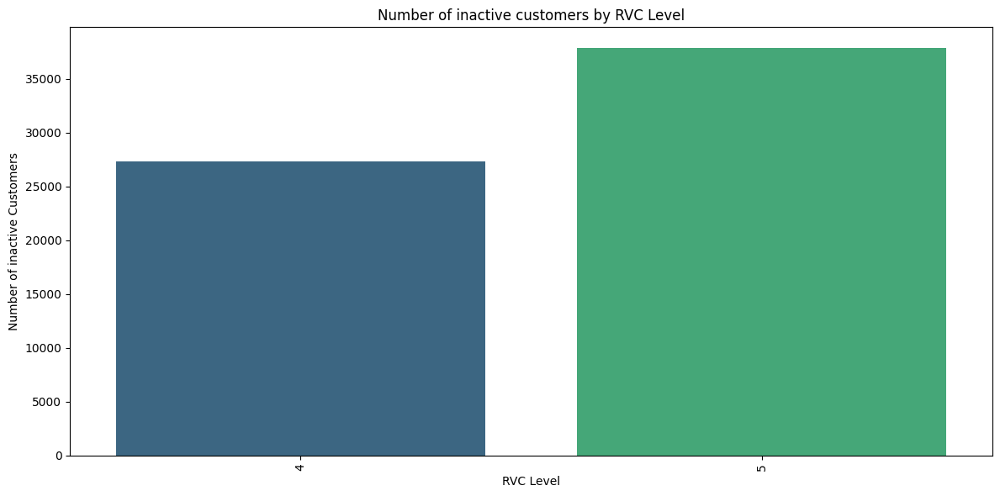

In [142]:
inactive_plot = inactive['RVC Level'].value_counts().head(30)
plt.figure(figsize=(12, 6))
sns.barplot(x= inactive_plot.index, y= inactive_plot.values, palette='viridis', hue= inactive_plot.index.astype(str), legend=False)
plt.title('Number of inactive customers by RVC Level')
plt.xlabel('RVC Level')
plt.ylabel('Number of inactive Customers')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Those who have not made any other purchase for a period of time (e.g more than 10 months)

In [143]:
# bảng những khách hàng rất recent (RVC Level = 1 -- mua hàng lần cuối trong 1 - 41 ngày đổ lại)
recent = legit_df[legit_df['RVC Level'] == 1]
print(recent)

       InvoiceNo StockCode                        Description  Quantity  \
9         536367     84879      ASSORTED COLOUR BIRD ORNAMENT        32   
10        536367     22745         POPPY'S PLAYHOUSE BEDROOM          6   
11        536367     22748          POPPY'S PLAYHOUSE KITCHEN         6   
12        536367     22749  FELTCRAFT PRINCESS CHARLOTTE DOLL         8   
13        536367     22310            IVORY KNITTED MUG COSY          6   
...          ...       ...                                ...       ...   
541904    581587     22613        PACK OF 20 SPACEBOY NAPKINS        12   
541905    581587     22899       CHILDREN'S APRON DOLLY GIRL          6   
541906    581587     23254      CHILDRENS CUTLERY DOLLY GIRL          4   
541907    581587     23255    CHILDRENS CUTLERY CIRCUS PARADE         4   
541908    581587     22138      BAKING SET 9 PIECE RETROSPOT          3   

               InvoiceDate  UnitPrice CustomerID         Country  Expenditure  \
9      2010-12-01 

In [144]:
# (vẽ thêm) recent customers by MVC Level
recent_mvc = recent['MVC Level'].value_counts()
print(recent_mvc)

MVC Level
1    351202
2     11540
3      7779
5      2507
4       339
Name: count, dtype: int64


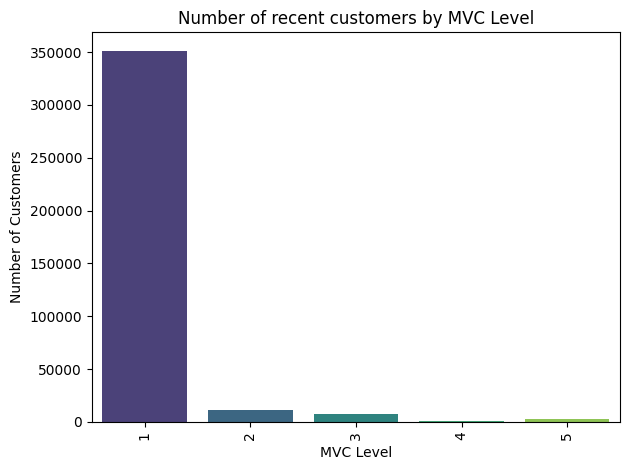

In [145]:
# Visualize bảng trên
sns.barplot(x= recent_mvc.index, y= recent_mvc.values, palette='viridis', hue= recent_mvc.index.astype(str), legend=False)
plt.title('Number of recent customers by MVC Level')
plt.xlabel('MVC Level')
plt.ylabel('Number of Customers')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [146]:
legit_df['RFM'].value_counts()

RFM
111    330309
211     49575
511     37914
311     36688
411     27332
131     10658
112      6481
121      5823
153      5670
151      4412
132      4180
125      2507
123      1395
122       879
113       714
124       336
114         3
512         1
Name: count, dtype: int64

Loyal Customers

In [147]:
Loyal = legit_df[
    legit_df['FVC Level'].isin([3, 5]) &
    legit_df['MVC Level'].isin([3, 4, 5]) &
    legit_df['RVC Level'].isin([1, 2])
]

print(Loyal.head(10))

     InvoiceNo StockCode                          Description  Quantity  \
1404    536540     22968           ROSE COTTAGE KEEPSAKE BOX          4   
1405    536540    85071A  BLUE CHARLIE+LOLA PERSONAL DOORSIGN         6   
1406    536540    85071C    CHARLIE+LOLA"EXTREMELY BUSY" SIGN         6   
1407    536540     22355            CHARLOTTE BAG SUKI DESIGN        50   
1408    536540     21579      LOLITA  DESIGN  COTTON TOTE BAG         6   
1409    536540     21576     LETS GO SHOPPING COTTON TOTE BAG         6   
1410    536540     22147           FELTCRAFT BUTTERFLY HEARTS        12   
1411    536540     22150             3 STRIPEY MICE FELTCRAFT        12   
1412    536540     22492              MINI PAINT SET VINTAGE         36   
1413    536540     22493            PAINT YOUR OWN CANVAS SET        24   

             InvoiceDate  UnitPrice CustomerID Country  Expenditure  \
1404 2010-12-01 14:05:00       9.95    14911.0    EIRE         39.8   
1405 2010-12-01 14:05:00       2

In [148]:
Loyal['CustomerID'].nunique()

1

Potential customers

In [149]:
potential_Loyal = legit_df[
    legit_df['FVC Level'].isin([1,2,3]) &
    legit_df['MVC Level'].isin([3,4, 5]) &
    legit_df['RVC Level'].isin([1, 2]) &
    (~legit_df['FVC'].isin([1]))
]
print(potential_Loyal.head(10))

      InvoiceNo StockCode                        Description  Quantity  \
6364     536890    17090A   LAVENDER INCENSE 40 CONES IN TIN        36   
6365     536890    17084R              ASSORTED INCENSE PACK      1440   
6366     536890    17091J             VANILLA INCENSE IN TIN        72   
14059    537448     21756           BATH BUILDING BLOCK WORD         6   
14067    537456     22469              HEART OF WICKER SMALL       402   
14068    537456     22470              HEART OF WICKER LARGE       378   
16425    537657     82484  WOOD BLACK BOARD ANT WHITE FINISH       408   
16426    537657     22830          UTILTY CABINET WITH HOOKS        30   
16427    537657     22189            CREAM HEART CARD HOLDER       972   
16428    537657     22188            BLACK HEART CARD HOLDER       972   

              InvoiceDate  UnitPrice CustomerID         Country  Expenditure  \
6364  2010-12-03 11:48:00       0.85    14156.0            EIRE        30.60   
6365  2010-12-03 11:48:00

In [150]:
potential_Loyal['CustomerID'].nunique()

6

Cost Conscious Customers

In [151]:
cost_conscious = legit_df[
    legit_df['FVC Level'].isin([3,5]) &
    legit_df['MVC Level'].isin([1,2,3]) &
    legit_df['RVC Level'].isin([1, 2])
]
print(cost_conscious.head(10))

    InvoiceNo StockCode                          Description  Quantity  \
106    536381     22139     RETROSPOT TEA SET CERAMIC 11 PC         23   
107    536381     84854                  GIRLY PINK TOOL SET         5   
108    536381     22411    JUMBO SHOPPER VINTAGE RED PAISLEY        10   
109    536381     82567            AIRLINE LOUNGE,METAL SIGN         2   
110    536381     21672   WHITE SPOT RED CERAMIC DRAWER KNOB         6   
111    536381     22774    RED DRAWER KNOB ACRYLIC EDWARDIAN        24   
112    536381     22771  CLEAR DRAWER KNOB ACRYLIC EDWARDIAN        24   
113    536381     71270                      PHOTO CLIP LINE         1   
114    536381     22262                FELT EGG COSY CHICKEN         1   
115    536381     22637                PIGGY BANK RETROSPOT          1   

            InvoiceDate  UnitPrice CustomerID         Country  Expenditure  \
106 2010-12-01 09:41:00       4.25    15311.0  United Kingdom        97.75   
107 2010-12-01 09:41:00      

In [152]:
cost_conscious['CustomerID'].nunique()

7

In [153]:
#Time interval between purchases for cost-conscious customers
cost_conscious_customers = cost_conscious['CustomerID'].unique()
average_time_between_purchases_cost_conscious = {}
for customer in cost_conscious_customers:
    customer_data = cost_conscious[cost_conscious['CustomerID'] == customer].sort_values(by='InvoiceDate')
    purchase_dates = customer_data['InvoiceDate'].unique()
    if len(purchase_dates) > 1:
        time_diffs = np.diff(purchase_dates).astype('timedelta64[D]').astype(int)
        average_time = np.mean(time_diffs)
        average_time_between_purchases_cost_conscious[customer] = average_time
    else:
        average_time_between_purchases_cost_conscious[customer] = None
print("Average Time Between Purchases for Cost-Conscious Customers (in days):")
for customer, avg_time in average_time_between_purchases_cost_conscious.items():
    print(f"CustomerID {customer}: {avg_time} days")

Average Time Between Purchases for Cost-Conscious Customers (in days):
CustomerID 15311.0: 3.588888888888889 days
CustomerID 12748.0: 1.4258373205741626 days
CustomerID 14911.0: 1.47 days
CustomerID 17841.0: 2.5528455284552845 days
CustomerID 14606.0: 3.5 days
CustomerID 12971.0: 4.060975609756097 days
CustomerID 13089.0: 3.619565217391304 days


In [154]:
# Time interval between purchases for potential-Loyal customers
potential_loyal_customers = potential_Loyal['CustomerID'].unique()
average_time_between_purchases_potential_loyal = {}
for customer in potential_loyal_customers:
    customer_data = potential_Loyal[potential_Loyal['CustomerID'] == customer].sort_values(by='InvoiceDate')
    purchase_dates = customer_data['InvoiceDate'].unique()
    if len(purchase_dates) > 1:
        time_diffs = np.diff(purchase_dates).astype('timedelta64[D]').astype(int)
        average_time = np.mean(time_diffs)
        average_time_between_purchases_potential_loyal[customer] = average_time
    else:
        average_time_between_purchases_potential_loyal[customer] = None
print("Average Time Between Purchases for Potential Loyal Customers (in days):")
for customer, avg_time in average_time_between_purchases_potential_loyal.items():
    print(f"CustomerID {customer}: {avg_time} days")

Average Time Between Purchases for Potential Loyal Customers (in days):
CustomerID 14156.0: 6.433962264150943 days
CustomerID 17450.0: 7.711111111111111 days
CustomerID 18102.0: 6.555555555555555 days
CustomerID 14646.0: 4.569444444444445 days
CustomerID 12415.0: 15.947368421052632 days
CustomerID 16446.0: 204.0 days


In [155]:
# Time interval between purchases for Loyal customers
loyal_customers = Loyal['CustomerID'].unique()
average_time_between_purchases_loyal = {}
for customer in loyal_customers:
    customer_data = Loyal[Loyal['CustomerID'] == customer].sort_values(by='InvoiceDate')
    purchase_dates = customer_data['InvoiceDate'].unique()
    if len(purchase_dates) > 1:
        time_diffs = np.diff(purchase_dates).astype('timedelta64[D]').astype(int)
        average_time = np.mean(time_diffs)
        average_time_between_purchases_loyal[customer] = average_time
    else:
        average_time_between_purchases_loyal[customer] = None
print("Average Time Between Purchases for Loyal Customers (in days):")
for customer, avg_time in average_time_between_purchases_loyal.items():
    print(f"CustomerID {customer}: {avg_time} days")

Average Time Between Purchases for Loyal Customers (in days):
CustomerID 14911.0: 1.47 days


In [156]:
rfm_253_customers = legit_df[legit_df['CustomerID'] == 16446.0 ]
print(rfm_253_customers)

       InvoiceNo StockCode                  Description  Quantity  \
194354    553573     22980       PANTRY SCRUBBING BRUSH         1   
194355    553573     22982          PANTRY PASTRY BRUSH         1   
540421    581483     23843  PAPER CRAFT , LITTLE BIRDIE     80995   

               InvoiceDate  UnitPrice CustomerID         Country  Expenditure  \
194354 2011-05-18 09:52:00       1.65    16446.0  United Kingdom         1.65   
194355 2011-05-18 09:52:00       1.25    16446.0  United Kingdom         1.25   
540421 2011-12-09 09:15:00       2.08    16446.0  United Kingdom    168469.60   

       InvoiceMonthYear       MVC  MVC Level  FVC  FVC Level  Recency  \
194354          2011-05  168472.5          4    2          1        1   
194355          2011-05  168472.5          4    2          1        1   
540421          2011-12  168472.5          4    2          1        1   

        RVC Level  RFM  
194354          1  114  
194355          1  114  
540421          1  114  


In [157]:
rfm_253_customers = legit_df[legit_df['CustomerID'] == 14911.0]['RFM']
print(rfm_253_customers)

1404      153
1405      153
1406      153
1407      153
1408      153
         ... 
539151    153
539152    153
539153    153
539154    153
539155    153
Name: RFM, Length: 5670, dtype: int64


In [158]:
rfm_153_customers = legit_df[legit_df['RFM'] == 153]['CustomerID'].unique()
print(rfm_153_customers)

[14911.0]


In [159]:
#Function made to automate the process for any CustomerID
def analyze_customer_behavior(customer_id):
    customer_data = legit_df[legit_df['CustomerID'] == customer_id]
    print(f"CustomerID {customer_id} data shape: {customer_data.shape}")
    
    unique_invoices = customer_data['InvoiceNo'].nunique()
    print(f"Number of unique invoices for CustomerID {customer_id}: {unique_invoices}")
    
    top_products = customer_data['Description'].value_counts().head(5)
    print(f"Top 5 most frequent products purchased by CustomerID {customer_id}:")
    print(top_products)
    
    first_3_invoices = customer_data['InvoiceNo'].unique()[:3]
    print(f"First 3 InvoiceNo for CustomerID {customer_id}:")
    print(first_3_invoices)
    
    invoice_details = customer_data[customer_data['InvoiceNo'].isin(first_3_invoices)]
    print(f"Details for first 3 InvoiceNo for CustomerID {customer_id}:")
    print(invoice_details.head(50))
    
    purchase_dates = customer_data[customer_data['InvoiceNo'].isin(first_3_invoices)]['InvoiceDate'].unique()
    time_diffs = np.diff(purchase_dates).astype('timedelta64[D]').astype(int)
    print(f"Time intervals between the first 3 purchases for CustomerID {customer_id} (in days):")
    print(time_diffs)

    average_spend_per_invoice = customer_data.groupby('InvoiceNo')['Expenditure'].mean()
    print(f"Average spend per InvoiceNo for CustomerID {customer_id}:")
    print(average_spend_per_invoice)
    
#Example usage
analyze_customer_behavior(16446.0)

CustomerID 16446.0 data shape: (3, 17)
Number of unique invoices for CustomerID 16446.0: 2
Top 5 most frequent products purchased by CustomerID 16446.0:
Description
PANTRY SCRUBBING BRUSH         1
PANTRY PASTRY BRUSH            1
PAPER CRAFT , LITTLE BIRDIE    1
Name: count, dtype: int64
First 3 InvoiceNo for CustomerID 16446.0:
[553573 581483]
Details for first 3 InvoiceNo for CustomerID 16446.0:
       InvoiceNo StockCode                  Description  Quantity  \
194354    553573     22980       PANTRY SCRUBBING BRUSH         1   
194355    553573     22982          PANTRY PASTRY BRUSH         1   
540421    581483     23843  PAPER CRAFT , LITTLE BIRDIE     80995   

               InvoiceDate  UnitPrice CustomerID         Country  Expenditure  \
194354 2011-05-18 09:52:00       1.65    16446.0  United Kingdom         1.65   
194355 2011-05-18 09:52:00       1.25    16446.0  United Kingdom         1.25   
540421 2011-12-09 09:15:00       2.08    16446.0  United Kingdom    168469.60 

In [160]:
#Loyal customers analysis
for customer_id in Loyal['CustomerID'].unique():
    print(f"\nAnalyzing CustomerID: {customer_id}")
    analyze_customer_behavior(customer_id)


Analyzing CustomerID: 14911.0
CustomerID 14911.0 data shape: (5670, 17)
Number of unique invoices for CustomerID 14911.0: 201
Top 5 most frequent products purchased by CustomerID 14911.0:
Description
CARRIAGE                              84
REGENCY CAKESTAND 3 TIER              49
WHITE HANGING HEART T-LIGHT HOLDER    33
ROSES REGENCY TEACUP AND SAUCER       33
GREEN REGENCY TEACUP AND SAUCER       28
Name: count, dtype: int64
First 3 InvoiceNo for CustomerID 14911.0:
[536540 536541 536803]
Details for first 3 InvoiceNo for CustomerID 14911.0:
     InvoiceNo StockCode                          Description  Quantity  \
1404    536540     22968           ROSE COTTAGE KEEPSAKE BOX          4   
1405    536540    85071A  BLUE CHARLIE+LOLA PERSONAL DOORSIGN         6   
1406    536540    85071C    CHARLIE+LOLA"EXTREMELY BUSY" SIGN         6   
1407    536540     22355            CHARLOTTE BAG SUKI DESIGN        50   
1408    536540     21579      LOLITA  DESIGN  COTTON TOTE BAG         6   

In [161]:
#potential Loyal Customers Analysis
#customer behavior of all potential Loyal Customers
for customer_id in potential_Loyal['CustomerID'].unique():
    print(f"\nAnalyzing CustomerID: {customer_id}")
    analyze_customer_behavior(customer_id)


Analyzing CustomerID: 14156.0
CustomerID 14156.0 data shape: (1395, 17)
Number of unique invoices for CustomerID 14156.0: 55
Top 5 most frequent products purchased by CustomerID 14156.0:
Description
CARRIAGE                            13
REGENCY CAKESTAND 3 TIER            12
ROSES REGENCY TEACUP AND SAUCER     10
VINTAGE SNAP CARDS                   9
SET OF 3 REGENCY CAKE TINS           9
Name: count, dtype: int64
First 3 InvoiceNo for CustomerID 14156.0:
[536890 541220 543114]
Details for first 3 InvoiceNo for CustomerID 14156.0:
      InvoiceNo StockCode                          Description  Quantity  \
6364     536890    17090A     LAVENDER INCENSE 40 CONES IN TIN        36   
6365     536890    17084R                ASSORTED INCENSE PACK      1440   
6366     536890    17091J               VANILLA INCENSE IN TIN        72   
58092    541220     22505            MEMO BOARD COTTAGE DESIGN       120   
58093    541220     22968           ROSE COTTAGE KEEPSAKE BOX         64   
5809

In [162]:
#Cost-conscious customers analysis
for customer_id in cost_conscious['CustomerID'].unique():
    print(f"\nAnalyzing CustomerID: {customer_id}")
    analyze_customer_behavior(customer_id)


Analyzing CustomerID: 15311.0
CustomerID 15311.0 data shape: (2366, 17)
Number of unique invoices for CustomerID 15311.0: 91
Top 5 most frequent products purchased by CustomerID 15311.0:
Description
EDWARDIAN PARASOL NATURAL            30
EDWARDIAN PARASOL BLACK              27
GLITTER HANGING BUTTERFLY STRING     24
JUMBO SHOPPER VINTAGE RED PAISLEY    20
RED TOADSTOOL LED NIGHT LIGHT        18
Name: count, dtype: int64
First 3 InvoiceNo for CustomerID 15311.0:
[536381 537195 537808]
Details for first 3 InvoiceNo for CustomerID 15311.0:
     InvoiceNo StockCode                          Description  Quantity  \
106     536381     22139     RETROSPOT TEA SET CERAMIC 11 PC         23   
107     536381     84854                  GIRLY PINK TOOL SET         5   
108     536381     22411    JUMBO SHOPPER VINTAGE RED PAISLEY        10   
109     536381     82567            AIRLINE LOUNGE,METAL SIGN         2   
110     536381     21672   WHITE SPOT RED CERAMIC DRAWER KNOB         6   
111  

In [163]:
%pip install hf_xet
%pip install sentence-transformers
%pip install tensorflow
%pip install tf-keras

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\wh1skey\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\wh1skey\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\wh1skey\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\wh1skey\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [164]:
#Basket Analysis
import pandas as pd
from sentence_transformers import SentenceTransformer
from sklearn.cluster import KMeans
import numpy as np

# 2. Load a lightweight AI model (downloads ~90MB once)
# 'all-MiniLM-L6-v2' is fast and great for short text
model = SentenceTransformer('intfloat/e5-large')

# 3. Create Embeddings (Convert text to numbers)
embeddings = model.encode(df['Description'].tolist())

# 4. Cluster them (Group similar items)
# We guess 300 clusters for this demo, but you can tune this
num_clusters = 300
clustering_model = KMeans(n_clusters=num_clusters, random_state=42)
clustering_model.fit(embeddings)
df['Cluster_ID'] = clustering_model.labels_

# 5. Find the "Representative" Name for each cluster
# We find the description closest to the center of the cluster
print("--- AI Suggested Categories ---")
for i in range(num_clusters):
    # Get all points in this cluster
    cluster_indices = np.where(df['Cluster_ID'] == i)[0]
    
    # Calculate the center (mean) of this cluster
    cluster_center = embeddings[cluster_indices].mean(axis=0)
    
    # Find the single product closest to this center
    distances = np.linalg.norm(embeddings[cluster_indices] - cluster_center, axis=1)
    closest_index = cluster_indices[distances.argmin()]
    representative_name = df.iloc[closest_index]['Description']
    
    print(f"\nCluster {i} (Representative: {representative_name}):")
    print(df[df['Cluster_ID'] == i]['Description'].tolist())

--- AI Suggested Categories ---

Cluster 0 (Representative: GARDENERS KNEELING PAD KEEP CALM ):
['POLYESTER FILLER PAD 45x45cm', 'POLYESTER FILLER PAD 45x30cm', 'POLYESTER FILLER PAD 40x40cm', 'POLYESTER FILLER PAD 40x40cm', 'POLYESTER FILLER PAD 45x30cm', 'POLYESTER FILLER PAD 45x45cm', 'POLYESTER FILLER PAD 65CMx65CM', 'POLYESTER FILLER PAD 45x45cm', 'POLYESTER FILLER PAD 40x40cm', 'GARDENERS KNEELING PAD', 'POLYESTER FILLER PAD 45x45cm', 'POLYESTER FILLER PAD 45x30cm', 'POLYESTER FILLER PAD 45x45cm', 'POLYESTER FILLER PAD 65CMx65CM', 'POLYESTER FILLER PAD 45x45cm', 'POLYESTER FILLER PAD 40x40cm', 'POLYESTER FILLER PAD 30CMx30CM', 'POLYESTER FILLER PAD 45x45cm', 'POLYESTER FILLER PAD 65CMx65CM', 'POLYESTER FILLER PAD 45x45cm', 'POLYESTER FILLER PAD 40x40cm', 'POLYESTER FILLER PAD 45x45cm', 'POLYESTER FILLER PAD 45x45cm', 'POLYESTER FILLER PAD 40x40cm', 'POLYESTER FILLER PAD 45x45cm', 'POLYESTER FILLER PAD 40x40cm', 'POLYESTER FILLER PAD 45x30cm', 'POLYESTER FILLER PAD 30CMx30CM', 'PO

In [165]:
print(df[['Description', 'Cluster_ID']].head(50))

                            Description  Cluster_ID
0    WHITE HANGING HEART T-LIGHT HOLDER          31
1                   WHITE METAL LANTERN         150
2        CREAM CUPID HEARTS COAT HANGER          43
3   KNITTED UNION FLAG HOT WATER BOTTLE         170
4        RED WOOLLY HOTTIE WHITE HEART.         289
5          SET 7 BABUSHKA NESTING BOXES          97
6     GLASS STAR FROSTED T-LIGHT HOLDER           2
7                HAND WARMER UNION JACK         289
8             HAND WARMER RED POLKA DOT         289
9         ASSORTED COLOUR BIRD ORNAMENT          53
10           POPPY'S PLAYHOUSE BEDROOM          101
11            POPPY'S PLAYHOUSE KITCHEN         101
12    FELTCRAFT PRINCESS CHARLOTTE DOLL          58
13              IVORY KNITTED MUG COSY          151
14   BOX OF 6 ASSORTED COLOUR TEASPOONS         118
15        BOX OF VINTAGE JIGSAW BLOCKS          255
16       BOX OF VINTAGE ALPHABET BLOCKS         255
17             HOME BUILDING BLOCK WORD         296
18          

In [166]:
#Export ClusterID to a new Excel file
df.to_excel('clustered_products.xlsx', index=False)

In [167]:
from collections import Counter
from itertools import combinations

#Perform basket analysis based on Cluster_ID
#Loyal customers analysis based on Cluster_ID
# Merge high_value_ids with df to get Cluster_ID for each product purchased by high-value customers
if 'Cluster_ID' in df.columns:
    high_value_ids_with_cluster = Loyal.merge(df[['InvoiceNo', 'StockCode', 'Cluster_ID']], on=['InvoiceNo', 'StockCode'], how='left')
else:
    high_value_ids_with_cluster = Loyal

# Analyze cross-sell: which clusters are bought together in the same invoice
cross_sell_patterns = (
    high_value_ids_with_cluster.groupby('InvoiceNo')['Cluster_ID']
    .apply(lambda x: list(set(x.dropna())))
    .reset_index()
)

# Count frequent cluster combinations (cross-sell)

cross_sell_counter = Counter()
for clusters in cross_sell_patterns['Cluster_ID']:
    if len(clusters) > 1:
        for combo in combinations(sorted(clusters), 2):
            cross_sell_counter[combo] += 1

print("Top 20 Cross-sell Cluster Pairs (Loyal Customers):")
for pair, count in cross_sell_counter.most_common(20):
    print(f"Clusters {pair}: {count} times")

#Optional: Cross-sell trio
cross_sell_trio_counter = Counter()
for clusters in cross_sell_patterns['Cluster_ID']:
    if len(clusters) > 2:
        for combo in combinations(sorted(clusters), 3):
            cross_sell_trio_counter[combo] += 1
print("\nTop 20 Cross-sell Cluster Trios (Loyal Customers):")
for trio, count in cross_sell_trio_counter.most_common(20):
    print(f"Clusters {trio}: {count} times")
#Optional: Cross-sell quartets
cross_sell_quartet_counter = Counter()
for clusters in cross_sell_patterns['Cluster_ID']:
    if len(clusters) > 3:
        for combo in combinations(sorted(clusters), 4):
            cross_sell_quartet_counter[combo] += 1
print("\nTop 20 Cross-sell Cluster Quartets (Loyal Customers):")
for quartet, count in cross_sell_quartet_counter.most_common(20):
    print(f"Clusters {quartet}: {count} times")


# Analyze up-sell: which clusters have higher average Expenditure per product
cluster_expenditure = (
    high_value_ids_with_cluster.groupby('Cluster_ID')['Expenditure']
    .mean()
    .sort_values(ascending=False)
)

print("\nTop 20 Up-sell Clusters (Loyal Customers) by Avg Expenditure:")
print(cluster_expenditure.head(20))

Top 20 Cross-sell Cluster Pairs (Loyal Customers):
Clusters (13, 21): 33 times
Clusters (13, 47): 31 times
Clusters (13, 114): 31 times
Clusters (47, 114): 31 times
Clusters (21, 31): 31 times
Clusters (21, 194): 29 times
Clusters (21, 195): 27 times
Clusters (13, 154): 25 times
Clusters (114, 154): 25 times
Clusters (16, 21): 24 times
Clusters (13, 275): 23 times
Clusters (47, 154): 23 times
Clusters (13, 74): 22 times
Clusters (21, 164): 22 times
Clusters (13, 56): 22 times
Clusters (15, 21): 21 times
Clusters (74, 275): 21 times
Clusters (21, 226): 21 times
Clusters (21, 211): 20 times
Clusters (21, 275): 20 times

Top 20 Cross-sell Cluster Trios (Loyal Customers):
Clusters (13, 47, 114): 28 times
Clusters (13, 114, 154): 24 times
Clusters (47, 114, 154): 23 times
Clusters (13, 47, 154): 22 times
Clusters (47, 49, 114): 16 times
Clusters (13, 74, 275): 15 times
Clusters (13, 47, 49): 15 times
Clusters (13, 49, 114): 15 times
Clusters (21, 47, 114): 14 times
Clusters (13, 49, 154): 1

In [168]:
#potential Loyal Customers analysis based on Cluster_ID
# Merge potential_Loyal with df to get Cluster_ID for each product purchased by potential Loyal customers
if 'Cluster_ID' in df.columns:
    potential_Loyal_with_cluster = potential_Loyal.merge(df[['InvoiceNo', 'StockCode', 'Cluster_ID']], on=['InvoiceNo', 'StockCode'], how='left')
else:
    potential_Loyal_with_cluster = potential_Loyal
# Analyze cross-sell: which clusters are bought together in the same invoice
cross_sell_patterns_potential = (
    potential_Loyal_with_cluster.groupby('InvoiceNo')['Cluster_ID']
    .apply(lambda x: list(set(x.dropna())))
    .reset_index()
)

# Count frequent cluster combinations (cross-sell)
cross_sell_counter_potential = Counter()
for clusters in cross_sell_patterns_potential['Cluster_ID']:
    if len(clusters) > 1:
        for combo in combinations(sorted(clusters), 2):
            cross_sell_counter_potential[combo] += 1
print("Top 20 Cross-sell Cluster Pairs (Potential Loyal Customers):")
for pair, count in cross_sell_counter_potential.most_common(20):
    print(f"Clusters {pair}: {count} times")

#Optional: Cross-sell trio
cross_sell_trio_potential = Counter()
for clusters in cross_sell_patterns['Cluster_ID']:
    if len(clusters) > 2:
        for combo in combinations(sorted(clusters), 3):
            cross_sell_trio_potential[combo] += 1
print("\nTop 20 Cross-sell Cluster Trios (Potential Loyal Customers):")
for trio, count in cross_sell_trio_potential.most_common(20):
    print(f"Clusters {trio}: {count} times")
#Optional: Cross-sell quartets
cross_sell_quartet_potential = Counter()
for clusters in cross_sell_patterns['Cluster_ID']:
    if len(clusters) > 3:
        for combo in combinations(sorted(clusters), 4):
            cross_sell_quartet_potential[combo] += 1
print("\nTop 20 Cross-sell Cluster Quartets (Potential Loyal Customers):")
for quartet, count in cross_sell_quartet_potential.most_common(20):
    print(f"Clusters {quartet}: {count} times")
    
# Analyze up-sell: which clusters have higher average Expenditure per product
cluster_expenditure_potential = (
    potential_Loyal_with_cluster.groupby('Cluster_ID')['Expenditure']
    .mean()
    .sort_values(ascending=False)
)
print("\nTop 20 Up-sell Clusters (Potential Loyal Customers) by Avg Expenditure:")
print(cluster_expenditure_potential.head(20))

Top 20 Cross-sell Cluster Pairs (Potential Loyal Customers):
Clusters (46, 84): 32 times
Clusters (54, 84): 30 times
Clusters (35, 84): 28 times
Clusters (46, 54): 26 times
Clusters (13, 21): 26 times
Clusters (56, 64): 25 times
Clusters (64, 84): 25 times
Clusters (35, 46): 25 times
Clusters (46, 64): 25 times
Clusters (35, 54): 24 times
Clusters (64, 152): 24 times
Clusters (54, 64): 23 times
Clusters (84, 87): 23 times
Clusters (122, 189): 22 times
Clusters (26, 54): 22 times
Clusters (50, 54): 22 times
Clusters (64, 287): 22 times
Clusters (35, 64): 21 times
Clusters (56, 84): 21 times
Clusters (64, 65): 21 times

Top 20 Cross-sell Cluster Trios (Potential Loyal Customers):
Clusters (13, 47, 114): 28 times
Clusters (13, 114, 154): 24 times
Clusters (47, 114, 154): 23 times
Clusters (13, 47, 154): 22 times
Clusters (47, 49, 114): 16 times
Clusters (13, 74, 275): 15 times
Clusters (13, 47, 49): 15 times
Clusters (13, 49, 114): 15 times
Clusters (21, 47, 114): 14 times
Clusters (13, 4

In [169]:
from collections import Counter
from itertools import combinations

#Perform basket analysis based on Cluster_ID
#Loyal customers analysis based on Cluster_ID
# Merge cost-conscious customers with df to get Cluster_ID for each product purchased by that segment
# support both possible variable names ('cost_concious' typo or correct 'cost_conscious')
target = globals().get('cost_concious') or globals().get('cost_conscious')
if target is None:
    raise NameError("Neither 'cost_concious' nor 'cost_conscious' dataframe found in the notebook.")
if 'Cluster_ID' in df.columns:
    high_value_ids_with_cluster = target.merge(df[['InvoiceNo', 'StockCode', 'Cluster_ID']], on=['InvoiceNo', 'StockCode'], how='left')
else:
    high_value_ids_with_cluster = target

# Analyze cross-sell: which clusters are bought together in the same invoice
cross_sell_patterns = (
    high_value_ids_with_cluster.groupby('InvoiceNo')['Cluster_ID']
    .apply(lambda x: list(set(x.dropna())))
    .reset_index()
)

# Count frequent cluster combinations (cross-sell)
cross_sell_counter = Counter()
for clusters in cross_sell_patterns['Cluster_ID']:
    if len(clusters) > 1:
        for combo in combinations(sorted(clusters), 2):
            cross_sell_counter[combo] += 1

print("Top 20 Cross-sell Cluster Pairs:")
for pair, count in cross_sell_counter.most_common(20):
    print(f"Clusters {pair}: {count} times")

#Optional: Cross-sell trio
cross_sell_trio_counter = Counter()
for clusters in cross_sell_patterns['Cluster_ID']:
    if len(clusters) > 2:
        for combo in combinations(sorted(clusters), 3):
            cross_sell_trio_counter[combo] += 1
print("\nTop 20 Cross-sell Cluster Trios:")
for trio, count in cross_sell_trio_counter.most_common(20):
    print(f"Clusters {trio}: {count} times")
#Optional: Cross-sell quartets
cross_sell_quartet_counter = Counter()
for clusters in cross_sell_patterns['Cluster_ID']:
    if len(clusters) > 3:
        for combo in combinations(sorted(clusters), 4):
            cross_sell_quartet_counter[combo] += 1
print("\nTop 20 Cross-sell Cluster Quartets:")
for quartet, count in cross_sell_quartet_counter.most_common(20):
    print(f"Clusters {quartet}: {count} times")
    
# Analyze up-sell: which clusters have higher average Expenditure per product
cluster_expenditure = (
    high_value_ids_with_cluster.groupby('Cluster_ID')['Expenditure']
    .mean()
    .sort_values(ascending=False)
)

print("\nTop 20 Up-sell Clusters by Avg Expenditure:")
print(cluster_expenditure.head(20))

Top 20 Cross-sell Cluster Pairs:
Clusters (21, 178): 95 times
Clusters (43, 178): 87 times
Clusters (16, 178): 86 times
Clusters (178, 200): 81 times
Clusters (21, 50): 81 times
Clusters (50, 178): 80 times
Clusters (21, 51): 78 times
Clusters (16, 50): 78 times
Clusters (16, 21): 77 times
Clusters (178, 189): 76 times
Clusters (21, 189): 75 times
Clusters (51, 178): 73 times
Clusters (21, 43): 71 times
Clusters (16, 43): 71 times
Clusters (5, 21): 70 times
Clusters (5, 178): 70 times
Clusters (97, 178): 70 times
Clusters (5, 50): 70 times
Clusters (43, 189): 69 times
Clusters (5, 200): 69 times

Top 20 Cross-sell Cluster Trios:
Clusters (21, 178, 189): 42 times
Clusters (50, 178, 200): 40 times
Clusters (97, 178, 200): 40 times
Clusters (50, 85, 135): 40 times
Clusters (21, 178, 200): 39 times
Clusters (5, 178, 189): 38 times
Clusters (85, 97, 135): 38 times
Clusters (50, 85, 97): 38 times
Clusters (0, 85, 97): 37 times
Clusters (51, 178, 200): 37 times
Clusters (21, 50, 178): 37 time